# Computer vision - Week_01 - Image processing

In [1]:
import numpy as np
import matplotlib.pyplot as plt
# from scipy import signal
from skimage.color import rgb2gray
from skimage import io, data, transform

plt.rcParams['font.size'] = 18

## Preparation of synthetic data
The np.linspace function is a part of the NumPy library in Python and is used to create an array of evenly spaced numbers over a specified range. The name "linspace" stands for "linear space," and it's commonly used for generating sequences of numbers that are evenly distributed.

`numpy.linspace(start, stop, num=50, endpoint=True, retstep=False, dtype=None, axis=0)`

- start: The starting value of the sequence.
- stop: The end value of the sequence.
- num: The number of evenly spaced values to generate between start and stop. The default is 50 if not specified.


In [2]:
# Domain of a function
x = np.linspace(0, 2*np.pi, 500)

In [3]:
print(x.shape)
print(x[499])

(500,)
6.283185307179586


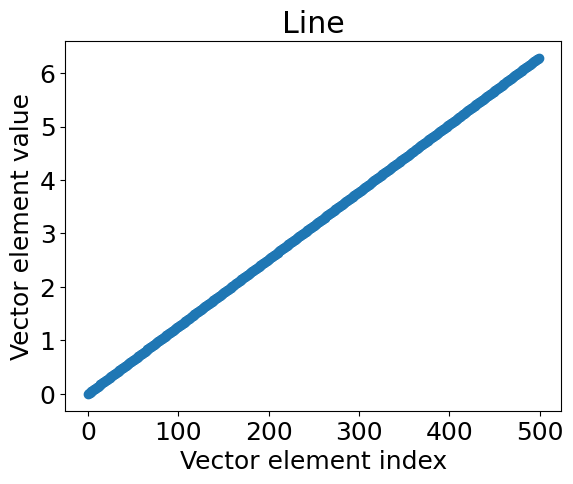

In [4]:
plt.title('Line')
plt.xlabel('Vector element index')
plt.ylabel('Vector element value')
plt.plot(x, "-o")

In [5]:
# Range of a function
y = np.sin(x)

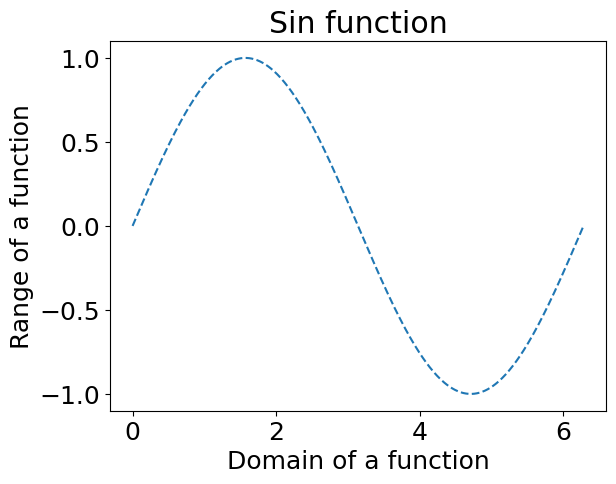

In [6]:
plt.figure()
plt.title('Sin function')
plt.xlabel('Domain of a function')
plt.ylabel('Range of a function')
plt.plot(x, y,'--')

## Generate random numbers
Create an array of the given shape and populate it with random samples from a uniform distribution over [0, 1)

### 1D

In [7]:
np.random.rand(10)

array([0.71137984, 0.38411934, 0.77900144, 0.10438387, 0.07095118,
       0.60274346, 0.77764082, 0.53500911, 0.43808477, 0.40238673])

### 2D (Random noise)

In [8]:
random_numbers_matrix = np.random.rand(128,256)
random_numbers_matrix.shape

(128, 256)

In [9]:
type(random_numbers_matrix)

numpy.ndarray

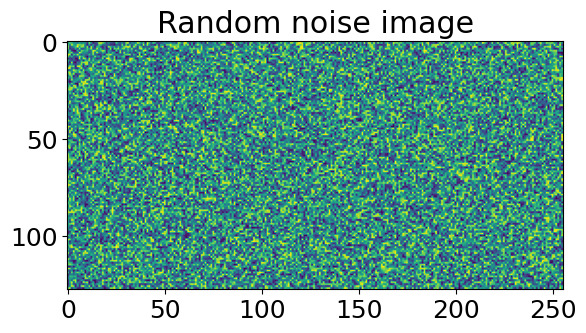

In [10]:
# It's possible to print ndarray (2D) as image.
plt.figure()
plt.title('Random noise image')
plt.imshow(random_numbers_matrix)

## Load image
### Load image from lib

We commonly load an image from the computer's hard drive. However, there is an option to load the image from an existing library, which we can utilize for initial experiments

In [ ]:
image_01 = data.astronaut()

In [12]:
print(image_01.shape)
print(type(image_01))

(512, 512, 3)
<class 'numpy.ndarray'>


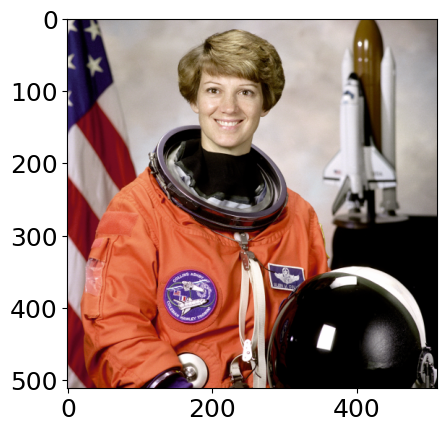

In [13]:
plt.imshow(image_01)

### Load image from local storage

In [14]:
# It's possible to use predefined images from library skimage.
image_02 = io.imread("data/worm.jpg")

In [15]:
print(image_02.shape)
print(type(image_02))

(1707, 2560, 3)
<class 'numpy.ndarray'>


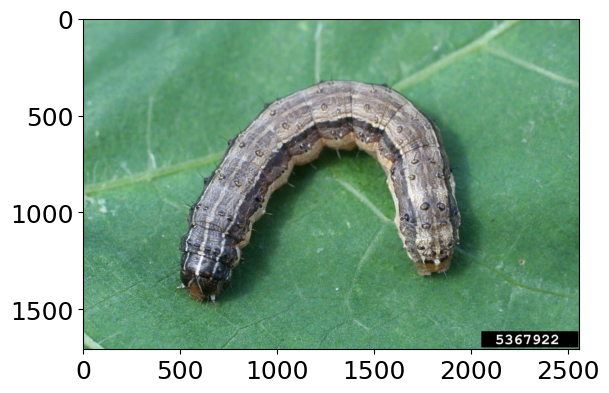

In [16]:
plt.imshow(image_02)

### Load image from url

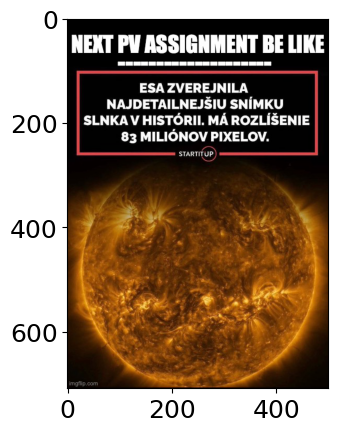

In [17]:
# Load the image from the URL
image_url = "https://i.redd.it/uncpw2ycdcq81.jpg"
image_03 = io.imread(image_url)
plt.imshow(image_03)

When loading data from disk or the internet in production, it's crucial to handle errors during the data loading process effectively.

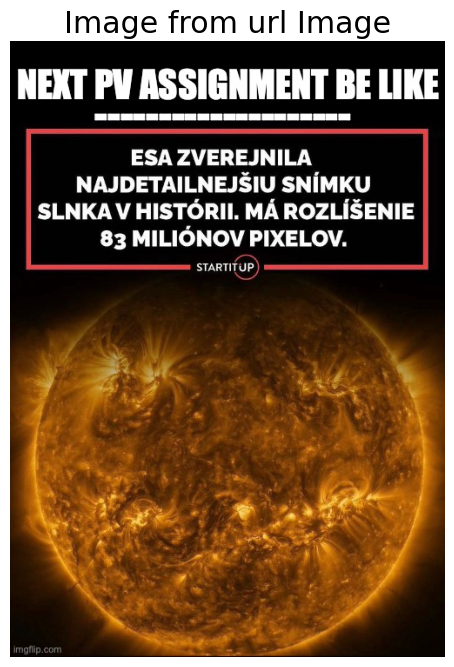

In [18]:
image_url = "https://i.redd.it/uncpw2ycdcq81.jpg"
try:
    # Load the image from the URL
    image_03 = io.imread(image_url)

    # Check if the image was loaded successfully
    if image_03 is not None:
        # Display the original image
        plt.figure(figsize=(8, 8))
        plt.imshow(image_03)
        plt.title("Image from url Image")
        plt.axis("off")
        plt.show()

    else:
        print("Failed to load the image from the URL.")

except Exception as e:
    print("An error occurred:", str(e))

## RGB to GrayScale image

In [19]:
print(image_01.shape)
image_01_gray = (rgb2gray(image_01) * 255).astype(dtype=np.uint8)
print(image_01_gray.shape)

(512, 512, 3)
(512, 512)


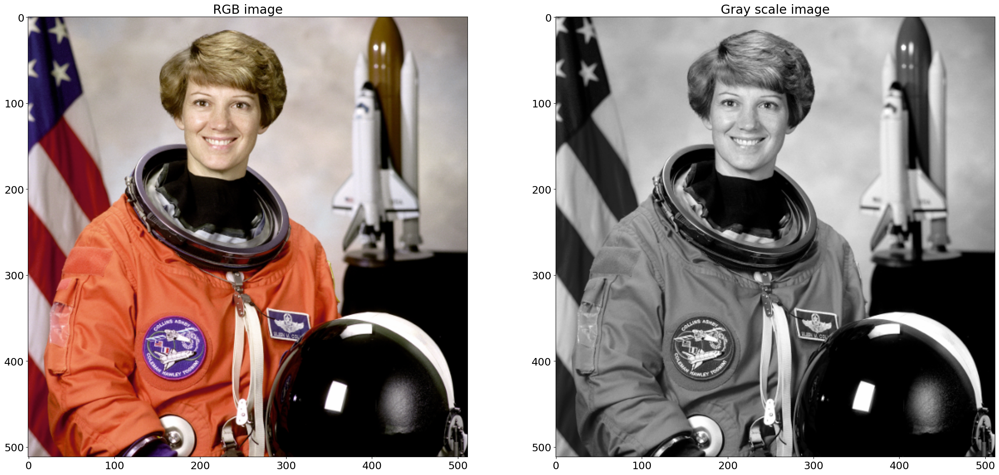

In [20]:
plt.figure(figsize= (30, 30))

plt.subplot(121)
plt.title('RGB image')
plt.imshow(image_01)

plt.subplot(122)
plt.title('Gray scale image')
# plt.imshow(image_01_gray)
plt.imshow(image_01_gray, cmap='gray')

In an RGB image, it is divided into three channels, each representing intensity for a different color. Brighter intensities indicate a greater contribution of that color to a given pixel. Darker pixel intensities signify a lesser contribution of that color.

In this image, alignment is demonstrated by combining three separate images into one larger one using the np.concatenate function.

<Figure size 640x480 with 0 Axes>

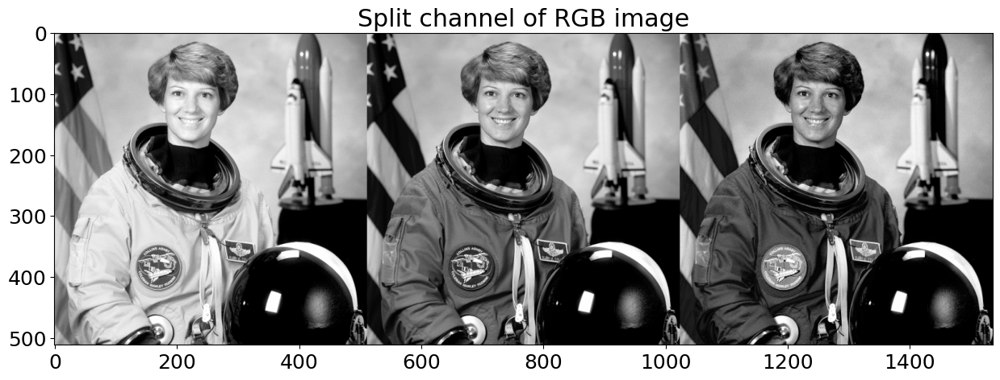

In [21]:
plt.figure()
plt.figure(figsize= (15, 60))
plt.title('Split channel of RGB image')
plt.imshow(np.concatenate((image_01[:, :, 0], image_01[:, :, 1], image_01[:, :, 2]), 1),cmap="gray")

### Manual RGB to GrayScale conversion

Converting an RGB image to grayscale is not difficult. One possible approach is described below. Note that the individual color channels do not contribute equally to the result because the eye is not equally sensitive to each color component. Simply averaging the channels would result in a bland image. You may also notice that the result is not identical to the result of the function rgb2gray. rgb2gray uses a slightly different set of constants (0.2989\*R + 0.5870\*G + 0.1140\*B).

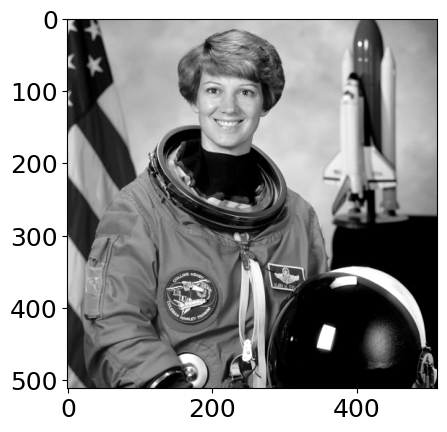

In [22]:
image_01_gray_manual = 0.2126 * image_01[:,:,0] + 0.7152 * image_01[:,:,1] + 0.0722 * image_01[:,:,2]
image_01_gray_manual = image_01_gray_manual.astype(dtype= np.uint8)
plt.figure()
plt.imshow(image_01_gray_manual, cmap= 'gray')

### Image comparison

Error count: 1012
Mean square error:  0.0038604736328125


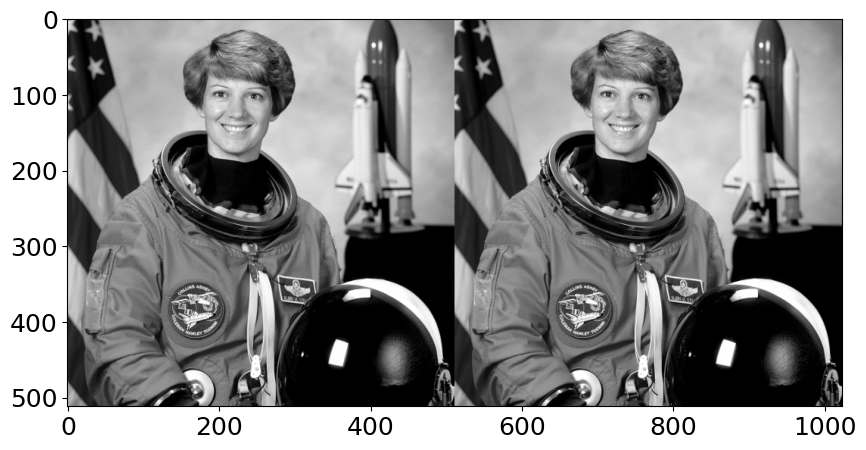

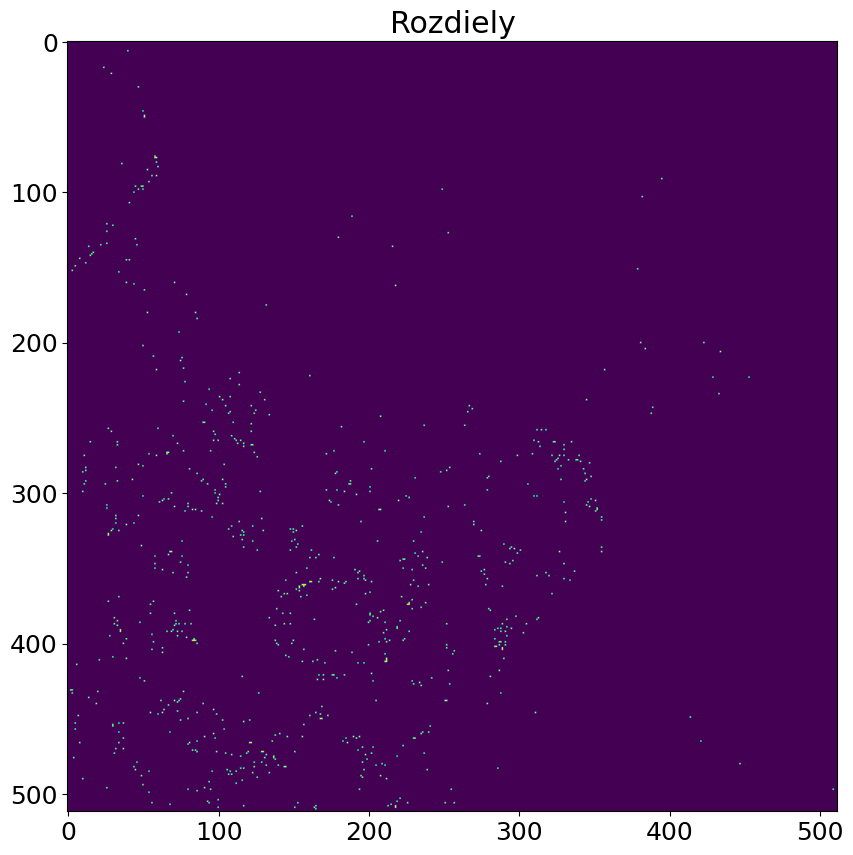

In [23]:
print("Error count:", np.sum((image_01_gray - image_01_gray_manual) ** 2))
print("Mean square error: ", np.sum((image_01_gray - image_01_gray_manual)**2 / image_01_gray_manual.size))

plt.figure(figsize= (10, 10))
plt.imshow(np.concatenate((image_01_gray, image_01_gray_manual), 1), cmap= 'gray')

plt.figure(figsize= (10, 10))
plt.title('Rozdiely')
plt.imshow(image_01_gray - image_01_gray_manual)

## Image manipulation
Image transformations are one of the fundamental operations in image processing. Today, there are numerous libraries offering a wide range of transformations. These transformations are also commonly used, for instance, when augmenting datasets during the training of neural network models.

[Image transformations - scikit-image](https://scikit-image.org/docs/stable/api/skimage.transform.html)

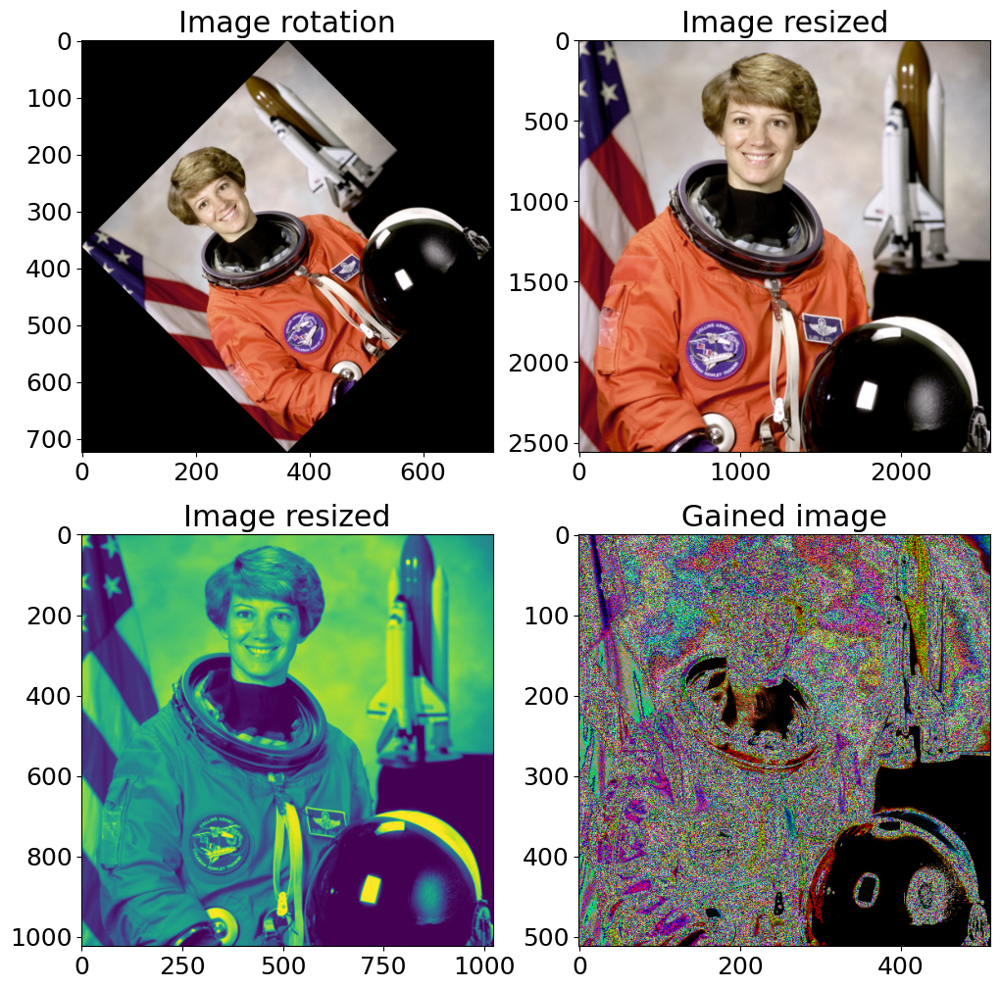

In [24]:
iRotated = transform.rotate(image_01, 45, resize=True)
iResized = transform.resize(image_01, (np.array(image_01.shape)[0] * 5, np.array(image_01.shape)[1] * 5), order= 1)
iResized2 = transform.rescale(image_01_gray, 2)


plt.figure(figsize= (12, 12))

plt.subplot(221)
plt.title('Image rotation')
plt.imshow(iRotated)

plt.subplot(222)
plt.title('Image resized')
plt.imshow(iResized)

plt.subplot(223)
plt.title('Image resized')
plt.imshow(iResized2)

plt.subplot(224)
plt.title('Gained image')
plt.imshow(image_01**2);

# HomeWork

Napíšte vlastný program, ktorý načíta obrázok, rozdelí ho pomyselnou mriežkou vami definovaných rozmerov a jednotlivé výrezy obrázku náhodne poprehadzuje. Zobrazte výsledok.

In [25]:
import random
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, transform

plt.rcParams['font.size'] = 18

In [26]:
class ImageShuffler:
    def __init__(self, web_url: str, grid_size: int, n_shuffles: int) -> None:
        self.__url = web_url
        self.__grid_size = grid_size
        self.__n_shuffles = n_shuffles

        self.__height = None
        self.__width = None

        self.__new_height = None
        self.__new_width = None

        self.__original_image = self.url_image_loader(self.__url)
        self.__shuffled_image = None

    '''Loader'''
    def url_image_loader(self, web_url:str = None) -> np.ndarray:
        if web_url is not None:
            self.__url = web_url

        try:
            img = io.imread(self.__url)

            if img is not None:
                self.__original_image = img
                self.__height = self.__original_image.shape[0]
                self.__width = self.__original_image.shape[1]
                return img
            else:
                print('Failed to load the image from the URL.')

        except Exception as exception:
            print('An error occurred:', str(exception))

    '''Adjustments'''
    def create_grid(self, show_dim:bool = False) -> None:
        height = self.__height
        width = self.__width

        if show_dim:
            print(f'Original Height: {height}px | Original Width: {width}px | Shape: {self.__original_image.shape}')

        # Find common dimension for grid
        if height % self.__grid_size != 0 or width % self.__grid_size != 0:
            height += self.__grid_size - (height % self.__grid_size)
            width += self.__grid_size - (width % self.__grid_size)

        self.__shuffled_image = transform.resize(self.__original_image, (height, width), order= 1)

        # Split image into grid
        size = self.__grid_size
        # self.__shuffled_image = np.reshape(self.__shuffled_image, (-1, size, size, self.__shuffled_image.shape[-1]))
        self.__shuffled_image = np.array([self.__shuffled_image[xx:xx + size, yy:yy + size]
                                         for xx in range(0, height, size)
                                         for yy in range(0, width, size)])

        self.__new_height = height
        self.__new_width = width

        if show_dim:
            print(f'Updated Height: {height}px | Updated Width: {width}px | Shape: {self.__shuffled_image.shape}')

        # plt.figure(figsize= (10, 10))             ########## DE-BUG
        #                                           ########## DE-BUG
        # plt.subplot(121)                          ########## DE-BUG
        # plt.title('Original Image')               ########## DE-BUG
        # plt.imshow(self.__shuffled_image[-1])     ########## DE-BUG

    def shuffle(self, n_shuffles:int = None) -> None:
        if n_shuffles is not None:
            self.__n_shuffles = n_shuffles

        size = self.__shuffled_image.shape[0]
        if size < 2:
            raise SyntaxError('Nothing to shuffle. Try smaller grid size.')

        for _ in range(self.__n_shuffles):
            idx1 = random.randrange(0, size)
            idx2 = random.randrange(0, size)
            while idx1 == idx2:     # Make sure it's not the same
                idx2 = random.randrange(0, size)

            temp_save = np.copy(self.__shuffled_image[idx1])
            self.__shuffled_image[idx1] = np.copy(self.__shuffled_image[idx2])
            self.__shuffled_image[idx2] = np.copy(temp_save)

            # print(idx1, idx2, size)               ########## DE-BUG

    def put_img_together(self) -> None:
        # self.__shuffled_image = np.reshape(self.__shuffled_image, (self.__new_height,
        #                                                            self.__new_width,
        #                                                            self.__shuffled_image.shape[-1]))
        new_img = list()
        for height in range(int(self.__new_height / self.__grid_size)):
            for yy in range(self.__grid_size):
                temp_list = list()
                for xx in range(int(self.__new_width / self.__grid_size)):
                    for zz in range(self.__grid_size):
                        temp_list.append(self.__shuffled_image[xx + (int(self.__new_width / self.__grid_size) * height)][yy][zz])
                new_img.append(np.array(temp_list))

        self.__shuffled_image = np.array(new_img)

        # print(self.__shuffled_image.shape)        ########## DE-BUG

    '''Visualisation'''
    def show_original_img(self) -> None:
        plt.figure(figsize=(8, 8))
        plt.imshow(self.__original_image)
        plt.title('Original Image from url')
        plt.axis('off')
        plt.show()

    def show_shuffled_img(self) -> None:
        plt.figure(figsize=(8, 8))
        plt.imshow(self.__shuffled_image)
        plt.title('Shuffled Image')
        plt.axis('off')
        plt.show()

    def compare_images(self) -> None:
        plt.figure(figsize= (30, 30))

        plt.subplot(121)
        plt.title('Original Image')
        plt.imshow(self.__original_image)

        plt.subplot(122)
        plt.title('Shuffled Image')
        plt.imshow(self.__shuffled_image)

Original Height: 664px | Original Width: 1601px | Shape: (664, 1601, 3)
Updated Height: 800px | Updated Width: 1800px | Shape: (36, 200, 200, 3)


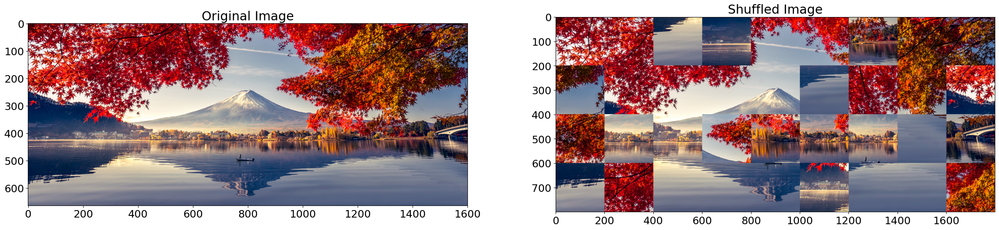

In [27]:
# program structure
url = 'https://helpx.adobe.com/content/dam/help/en/photoshop/using/convert-color-image-black-white/jcr_content/' \
      'main-pars/before_and_after/image-before/Landscape-Color.jpg'
# url = 'https://interactive-examples.mdn.mozilla.net/media/cc0-images/grapefruit-slice-332-332.jpg'
# url = 'https://raw.githubusercontent.com/QuietXO/School_Private/main/Computer_Vision/data/8x8.png?token=GHSAT0AAAAAACHNOJTYEMVXLL6CSFV33ZTQZIVCKSQ'

grid = 200               # grid * grid pixels
number_of_shuffles = 10

# program here
image = ImageShuffler(url, grid, number_of_shuffles)
image.create_grid(show_dim=True)
image.shuffle()
image.put_img_together()

# plot original and shuffled image
image.compare_images()